<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: lightgray;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Dog breed identification
</h2>
</div>

1. [Introduction](#introduction)
1. [Data Collection](#datacollection)
1. [Data Analysis](#dataanalysis)
    1. [Explore Labels](#explorelabels)
    1. [Explore Images](#exploreimages)
    1. [Data Visualization](#datavisualization)
1. [Data Preprocessing](#datapreprocessing)
    1. [Data Augmentation](#dataaugmentation)
    1. [Labels encoding](#labelsencoding)
    1. [Create Dataset](#createdataset)
1. [Model Training and Evaluation](#trainandevaluate)
    1. [Search best models](#searchbestmodels)
    1. [Stacking classifier](#stackingclassifier)
1. [Testing](#testing)
1. [Conclusion](#conclusion)

# Introduction <a class="anchor" id="introduction"></a>

According to the American Kennel Club (AKC), there are nearly 200 recognized dog breeds, each with distinct characteristics and traits. Dog breed identification is a fascinating challenge with practical applications in veterinary care, pet adoption, and lost pet recovery. This dataset, sourced from Dog Breed Identification competition, consists of thousands of labeled images representing nearly 200 different dog breeds. By leveraging advanced image recognition techniques, this project aims to develop an AI model capable of accurately classifying dog breeds from images. The ability to swiftly and accurately identify a dog's breed can aid in understanding the pet's behavior, health predispositions, and care requirements, providing valuable insights and enhancing various animal-related services.

In this notebook, for the task of dog breed identification, we try to evaluate different prelearned models from <a href="https://keras.io/api/applications/">Keras Applications</a>, evaluate individual models, and then also build a stacking classifier from the best of them. It is also interesting to check how well models based on CNNs perform indvidually and when ensembled.

In [ ]:
%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=(RuntimeWarning, FutureWarning, UserWarning))

import time
import os
import numpy as np
import pandas as pd
import math
import gc
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import itertools
from itertools import islice
import tensorflow as tf
import keras_tuner as kt
import keras
from keras import layers, Model
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Input, concatenate, Concatenate, GlobalAveragePooling2D, BatchNormalization
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam, RMSprop
from keras.utils import to_categorical, plot_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.losses import categorical_crossentropy, SparseCategoricalCrossentropy
from keras.metrics import categorical_accuracy
from keras.applications import Xception, InceptionResNetV2, MobileNetV2, DenseNet201, EfficientNetB4, NASNetLarge
from IPython.display import Markdown, display
from sklearn.preprocessing import LabelEncoder

# Disable LayoutOptimizer to avoid INVALID_ARGUMENT errors
os.environ['TF_DISABLE_MKL'] = '1'
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
os.environ['TF_ENABLE_LAYOUT_OPTIMIZER'] = '0'

# to make this notebook's output stable across runs
np.random.seed(23200383)
tf.random.set_seed(23200383)

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [ ]:
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

TensorFlow version: 2.17.0
Num GPUs Available:  1


## Data Collection <a class="anchor" id="datacollection"></a>

In [ ]:
labels_path = "/labels.csv"

labels_df = pd.read_csv(labels_path)

In [1]:
train_folder = "/train/"
test_folder = "/test/"
train_folder, test_folder

('/train/', '/test/')

# Data Analysis <a class="anchor" id="dataanalysis"></a>

This section provides an overview of the dataset and exploratory data analysis is perfomed to understand the data better.

## Explore Labels <a class="anchor" id="explorelabels"></a>

In [ ]:
#describe
labels_df.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


The dataset consists of 10222 rows and 2 columns, representing the
- **id** : The unique identifier for each image file, and
- **breed** : The breed of the dog in the image

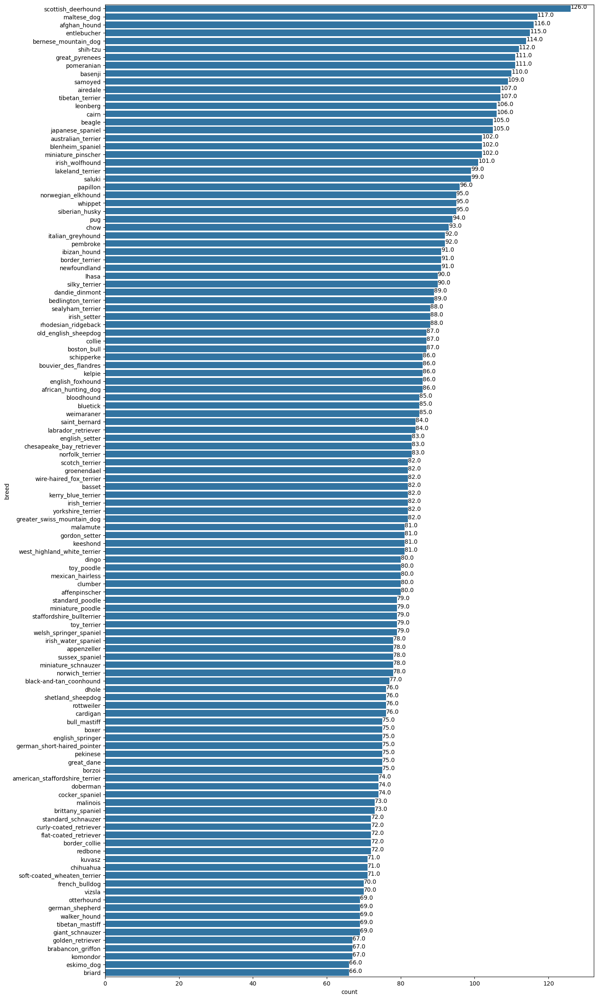

In [ ]:
import seaborn as sns
#function to show bar length
def barw(ax):

    for p in ax.patches:
        val = p.get_width() #height of the bar
        x = p.get_x()+ p.get_width() # x- position
        y = p.get_y() + p.get_height()/2 #y-position
        ax.annotate(round(val,2),(x,y))

#finding top dog brands

# 1. Barplot
plt.figure(figsize = (15,30))
ax0 = sns.countplot(y=labels_df['breed'],order=labels_df['breed'].value_counts().index)
barw(ax0)
plt.show()

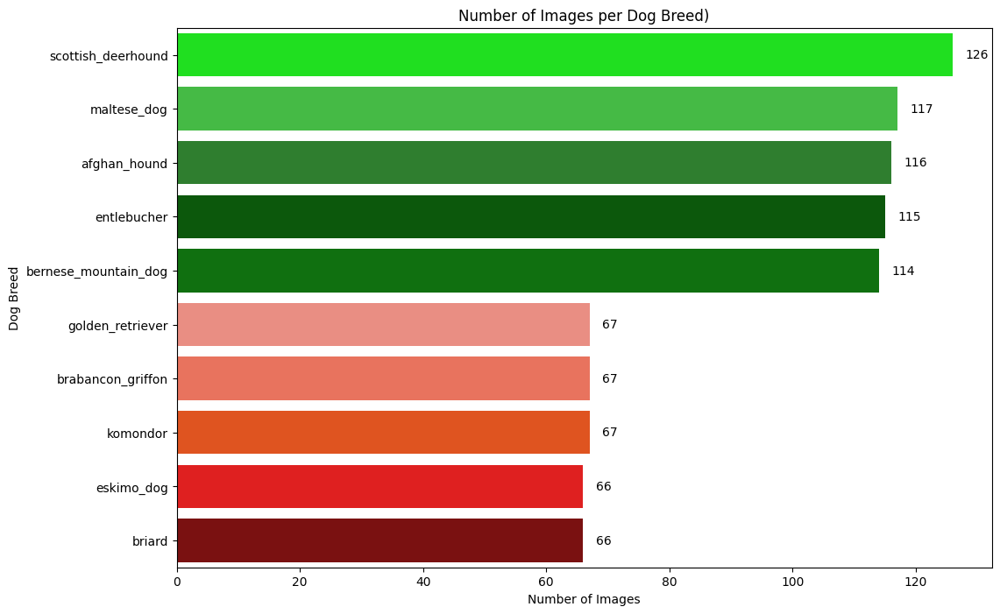

In [ ]:
breed_counts = labels_df['breed'].value_counts()

# Extracting top 5 and bottom 5 breeds
top_5 = breed_counts.head(5)
bottom_5 = breed_counts.tail(5)

# Combine top 5 and bottom 5 into a single DataFrame for plotting
top_bottom_10 = pd.concat([top_5, bottom_5])

# Create a color palette with gradient green for top 5 and gradient red for bottom 5
colors = ['lime', 'limegreen', 'forestgreen', 'darkgreen', 'green']
colors += ['salmon', 'tomato', 'orangered', 'red', 'darkred']
palette = sns.color_palette(colors, n_colors=10)

# Plotting the combined bar chart with data labels
plt.figure(figsize=(12, 8))
plot = sns.barplot(y=top_bottom_10.index, x=top_bottom_10.values, palette=palette)

# Adding data labels to the bars
for i, v in enumerate(top_bottom_10.values):
    plot.text(v + 2, i, str(v), ha='left', va='center', fontsize=10, color='black')

# 2. Top and Bottom 5 Dog Breeds
plt.title('Number of Images per Dog Breed)')
plt.xlabel('Number of Images')
plt.ylabel('Dog Breed')
plt.show()

This bar chart illustrates the number of images available for the top 5 and bottom 5 dog breeds in the dataset. The colors indicate the ranking, with green shades representing the top 5 breeds, highest for the breed 'Scottish Deerhound' with 126 images and red shades representing the bottom 5, least for the breed 'Briard' and 'eskimo dog', with 66 images. This visual representation highlights the disparity in the number of images between the most and least represented breeds.

Each image has a unique ID, ensuring no duplicates. This diverse and well-distributed dataset is ideal for training a robust AI model for dog breed classification.

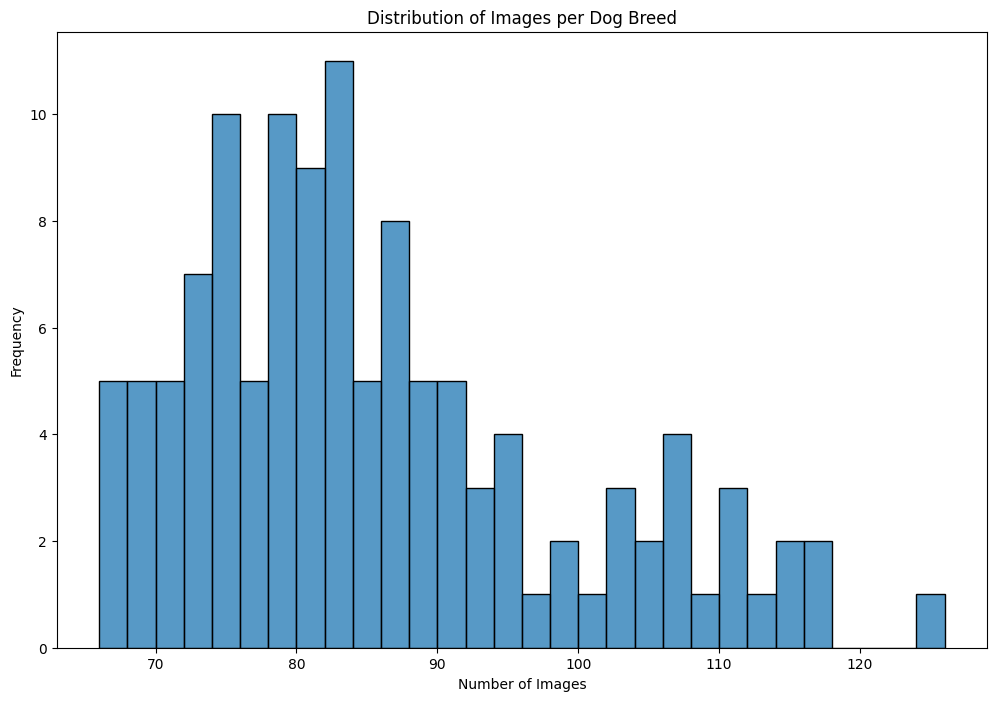

In [ ]:
# 3. Distribution of Target Variable - Numerical Attributes
plt.figure(figsize=(12, 8))
sns.histplot(breed_counts, bins=30, kde=False)
plt.title('Distribution of Images per Dog Breed')
plt.xlabel('Number of Images')
plt.ylabel('Frequency')
plt.show()

* Central Tendency: The mode of the dataset falls between 90 and 95 images per breed, indicating that this is the most common image count for dog breeds in the dataset.

* Data Distribution: The histogram shows a mild right skew, implying that a larger number of dog breeds have fewer than the modal number of images, while a smaller number have significantly more.

* Range and Variability: The number of images ranges from under 70 to over 120 per breed, demonstrating notable variability in data availability across different breeds.

* Impact on Model Training: The uneven distribution of images can lead to potential biases in the AI model, favoring breeds with more images. Techniques like data augmentation or oversampling may be necessary to ensure balanced training and accurate breed identification, which is covered in the below sections.

In [ ]:
print(f'Labels shape:\t {labels_df.shape}')

Labels shape:	 (10222, 2) 
Submission shape:	 (10357, 121)


In [ ]:
# #total unique breeds

labels_df['breed'].nunique()

120

In [ ]:
labels_df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
import os
if len(os.listdir('/train/')) == len(labels_df['id']):
    print('Number of file matches number of actual images!')
else:
    print('Number of file doesnot matches number of actual images!!')

Number of file matches number of actual images!


In [ ]:
#Create list of alphabetically sorted labels.
classes = sorted(list(set(labels_df['breed'])))
n_classes = len(classes)
print('Total unique breed {}'.format(n_classes))


#Map each label string to an integer label.
class_to_num = dict(zip(classes, range(n_classes)))
class_to_num

Total unique breed 120


{'affenpinscher': 0,
 'afghan_hound': 1,
 'african_hunting_dog': 2,
 'airedale': 3,
 'american_staffordshire_terrier': 4,
 'appenzeller': 5,
 'australian_terrier': 6,
 'basenji': 7,
 'basset': 8,
 'beagle': 9,
 'bedlington_terrier': 10,
 'bernese_mountain_dog': 11,
 'black-and-tan_coonhound': 12,
 'blenheim_spaniel': 13,
 'bloodhound': 14,
 'bluetick': 15,
 'border_collie': 16,
 'border_terrier': 17,
 'borzoi': 18,
 'boston_bull': 19,
 'bouvier_des_flandres': 20,
 'boxer': 21,
 'brabancon_griffon': 22,
 'briard': 23,
 'brittany_spaniel': 24,
 'bull_mastiff': 25,
 'cairn': 26,
 'cardigan': 27,
 'chesapeake_bay_retriever': 28,
 'chihuahua': 29,
 'chow': 30,
 'clumber': 31,
 'cocker_spaniel': 32,
 'collie': 33,
 'curly-coated_retriever': 34,
 'dandie_dinmont': 35,
 'dhole': 36,
 'dingo': 37,
 'doberman': 38,
 'english_foxhound': 39,
 'english_setter': 40,
 'english_springer': 41,
 'entlebucher': 42,
 'eskimo_dog': 43,
 'flat-coated_retriever': 44,
 'french_bulldog': 45,
 'german_shepherd'

## Explore images <a class="anchor" id="exploreimages"></a>

By evaluating image sizes, it is useful for selecting image sizes for model learning.

In [ ]:
def get_images_info(folder):
    size_images = dict()
    for file_name in os.listdir(folder):
        if file_name.endswith('.jpg'):
            file_path = os.path.join(folder, file_name)
            with Image.open(file_path) as img:
                width, heigth = img.size
                resolution = width*heigth
                root_resolution = math.sqrt(resolution)
                ratioHW = heigth / width
                size_images[file_name] = {'width': width, 'heigth': heigth, 'resolution': resolution,
                                          'root_resolution': root_resolution, 'ratioHW': ratioHW}
    return size_images

In [ ]:
images_info_dict = get_images_info(train_folder)
images_info_pd = pd.DataFrame.from_dict(images_info_dict, orient='index')
images_info_pd.head()

,width,heigth,resolution,root_resolution,ratioHW
84accc2dc9f5bb3ebee89fe1bf23639c.jpg,500,430,215000,463.680925,0.860000
14cffe576239620f1733dfe487dbaa6f.jpg,400,300,120000,346.410162,0.750000
cc93915e06bc55626a02af95006a48c2.jpg,272,350,95200,308.544972,1.286765
6f9bac41b5be5ee6baecc9e7ef8f2c2a.jpg,500,400,200000,447.213595,0.800000
64dd586a1d08937d20618233df2e5dbc.jpg,500,375,187500,433.012702,0.750000


In [ ]:
images_info_pd.describe()

,width,heigth,resolution,root_resolution,ratioHW
count,10222.00000,10222.000000,1.022200e+04,10222.000000,10222.000000
mean,443.33154,386.747212,1.841763e+05,410.013726,0.913662
std,152.42012,130.068327,2.303240e+05,126.754338,0.287223
min,97.00000,102.000000,1.224000e+04,110.634533,0.384000
25%,360.00000,333.000000,1.650000e+05,406.201920,0.748000
50%,500.00000,375.000000,1.838750e+05,428.806458,0.750000
75%,500.00000,452.000000,1.875000e+05,433.012702,1.079914
max,3264.00000,2562.000000,7.990272e+06,2826.706918,2.540816


1. **Image Dimensions**:
   - **Mean Width**: 443 pixels, with a range from 97 to 3264 pixels.
   - **Mean Height**: 387 pixels, ranging from 102 to 2562 pixels.
   - **Aspect Ratio**: Average near 0.91, suggesting images are typically more vertical.

2. **Variability**: High standard deviations for both width and height indicate a diverse set of image sizes.

3. **Resolution**: Mean resolution is 184,176 pixels, with a very high maximum of 7,990,272 pixels, highlighting the presence of ultra-high-resolution images.

4. **Data Distribution**: The middle 50% of images have dimensions between 360x333 pixels and 500x452 pixels, suitable for standardizing inputs.

5. **Implications for Model Training**:
   - Variation in size and resolution suggests the need for resizing and normalization in pre-processing to ensure consistent model input.
   - Downscaling high-resolution is necessary to optimize computational efficiency without sacrificing detail needed for accurate classification.

### Data Visualization <a class="anchor" id="datavisualization"></a>

In [ ]:
def plot_image_from_path(image_path, label):
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(label)
    plt.show()

Plot random image.

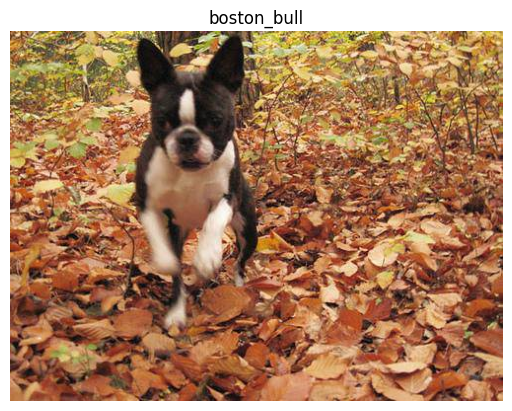

In [ ]:
image_item = labels_df.iloc[0]
path_to_image = os.path.join(train_folder, f"{image_item.id}.jpg")
plot_image_from_path(path_to_image, image_item.breed)

# Data Preprocessing <a class="anchor" id="datapreprocessing"></a>

This section covers the steps taken for data pre-processing. Since there are no missing data, and the dataset also seems well balanced, the data seems good enough to proceed with and does not require cleaning, but the data is well augmented as below.

### Data Augmentation <a class="anchor" id="dataaugmentation"></a>

In [ ]:
# Data Preprocessing
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
], name='data_augmentation')

2024-08-11 22:11:48.334935: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2024-08-11 22:11:48.334955: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-08-11 22:11:48.334960: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-08-11 22:11:48.334977: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-08-11 22:11:48.334990: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


The data augmentation setup implements horizontal flipping and random rotations up to approximately 5.7 degrees. This approach broadens the dataset's variability, teaching the model to recognize dog breeds regardless of image orientation and slight angular shifts. Such enhancements are crucial for improving the model's generalization capabilities across varied real-world imaging conditions, potentially boosting accuracy in diverse scenarios without needing extra data collection.

### Labels encoding <a class="anchor" id="labelsencoding"></a>

Encode breeds with a value between 0 and 119 using sklearn.preprocessing.LabelEncoder and then convert these values to one-hot encoding.

In [ ]:
labels_df['label'] = LabelEncoder().fit_transform(labels_df.breed)
labels_df.head()

,id,breed,label
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull,19
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo,37
2,001cdf01b096e06d78e9e5112d419397,pekinese,85
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick,15
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever,49


In [ ]:
labels_list = labels_df['label'].to_numpy().tolist()

In [ ]:
# Load your labels dataframe
labels_df['label'] = LabelEncoder().fit_transform(labels_df.breed)
labels_list = labels_df['label'].to_numpy().tolist()
y_full_oh = tf.keras.utils.to_categorical(labels_list, num_classes=120)
y_full_oh[0:1]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.]])

Create an additional dictionary for identifying breed labels from numeric values.

In [ ]:
labels_breeds_df = labels_df[['label','breed']].copy()
labels_breeds_df.drop_duplicates(inplace=True)
labels_breeds_df.set_index('label',drop=True,inplace=True)
index_to_breed = labels_breeds_df.to_dict()['breed']
list(islice(index_to_breed.items(), 10))

[(19, 'boston_bull'),
 (37, 'dingo'),
 (85, 'pekinese'),
 (15, 'bluetick'),
 (49, 'golden_retriever'),
 (10, 'bedlington_terrier'),
 (18, 'borzoi'),
 (7, 'basenji'),
 (97, 'scottish_deerhound'),
 (99, 'shetland_sheepdog')]

In [ ]:
dog_breeds = sorted(list(index_to_breed.values()))
dog_breeds[:10]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle']

In [ ]:
len(dog_breeds)

120

### Create Dataset <a class="anchor" id="createdataset"></a>

In [ ]:
# Create Dataset
def prepare_ds(ds, prep_input_fx, cache_ds=False, shuffle=False, batch_size=32, prefetch=True):
    ds_has_y = isinstance(ds.element_spec, tuple)
    if ds_has_y:
        ds = ds.map(lambda x, y: (prep_input_fx(x), y))
    else:
        ds = ds.map(lambda x: prep_input_fx(x))
    if cache_ds:
        ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(128)
    ds = ds.batch(batch_size)
    if prefetch:
        ds = ds.prefetch(tf.data.AUTOTUNE)
    return ds

def create_raw_ds(train_folder, labels_list, split_size=0.1, image_size=(224,224)):
    train_ds_raw, val_ds_raw = tf.keras.utils.image_dataset_from_directory(
        train_folder,
        labels=labels_list,
        label_mode='categorical',
        validation_split=0.1,
        shuffle=False,
        subset="both",
        image_size=image_size,
        batch_size=None,
        crop_to_aspect_ratio=False
    )
    return train_ds_raw, val_ds_raw

#### Data Visualization

Review and visualize images in the created dataset.

In [ ]:
train_ds_raw, val_ds_raw = create_raw_ds(train_folder, labels_list, image_size=IMAGE_SIZE)
test_ds_raw = tf.keras.utils.image_dataset_from_directory(
    test_folder,
    labels=None,
    shuffle=False,
    image_size=IMAGE_SIZE,
    batch_size=None,
    crop_to_aspect_ratio=False
)

train_ds = train_ds_raw.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds_raw.batch(BATCH_SIZE)
test_ds = test_ds_raw.batch(BATCH_SIZE)

Found 10222 files belonging to 120 classes.
Using 9200 files for training.
Using 1022 files for validation.
Found 10357 files.


Training Set (80%): Used to train the machine learning model. It contains a significant number of samples (9200) to ensure the model learns patterns and features effectively.

Validation Set (20%): Used to evaluate the model's performance during training. With 1022 samples, it provides a sufficient number of examples to assess how well the model generalizes to unseen data.

In [ ]:
def plot_ds_images(ds):
    plt.figure(figsize=(10, 10))
    for images, labels in ds.take(1):
        lbl=labels.numpy()
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype('uint8'))
            plt.title(index_to_breed[lbl[i].argmax()])
            plt.axis("off")

2024-08-11 22:11:49.522563: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


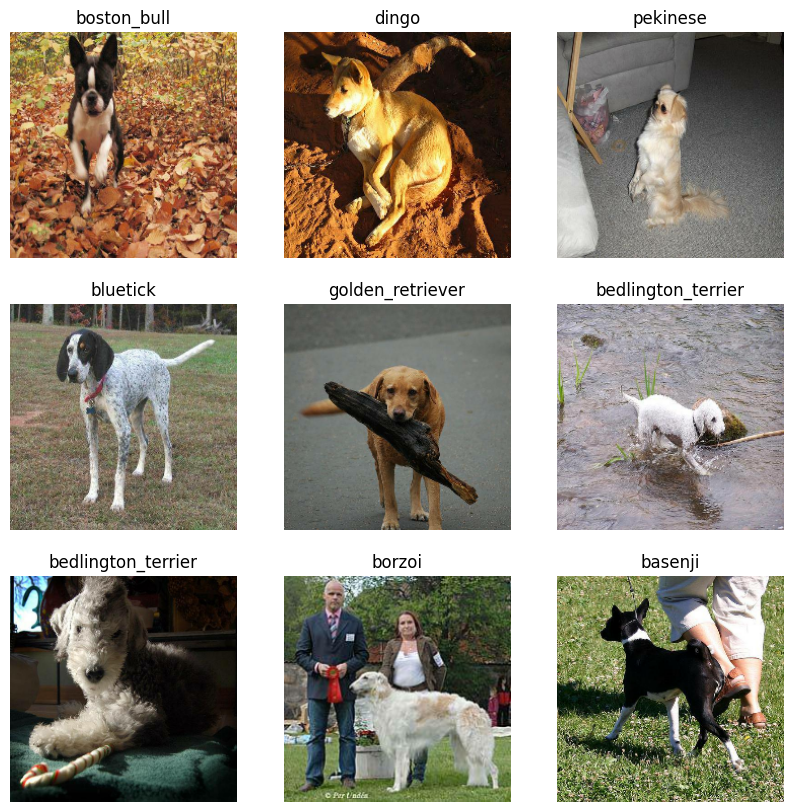

In [ ]:
plot_ds_images(train_ds)

2024-08-11 22:11:50.308549: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


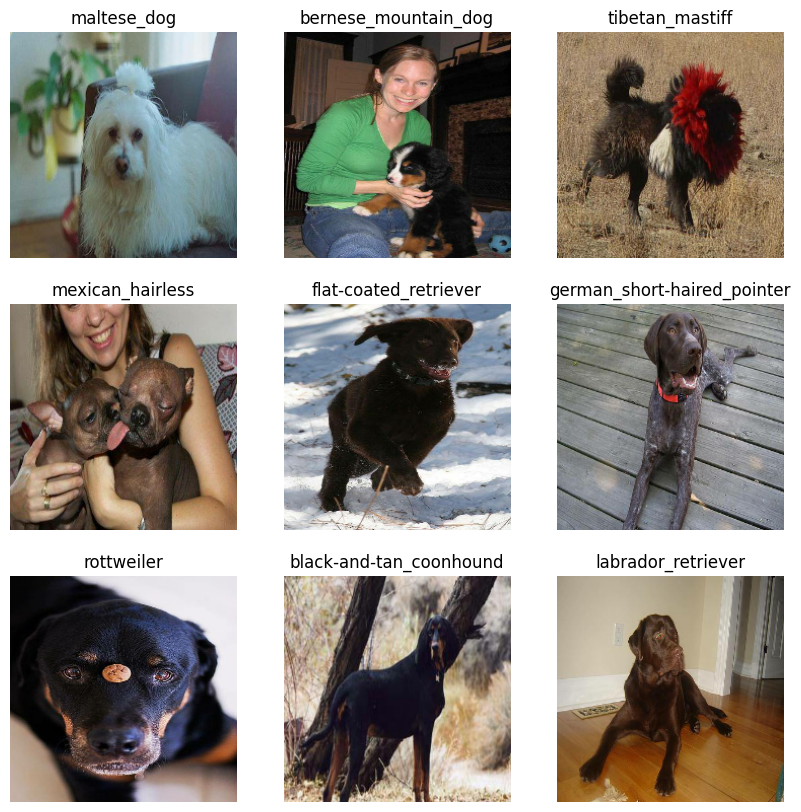

In [ ]:
plot_ds_images(val_ds)

In [ ]:
gc.collect()

26835

# Model Training and Evaluation <a class="anchor" id="trainandevaluate"></a>

In [ ]:
# Define callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True
)

reduce_lr_on_plateau = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6
)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    'best_model.keras',
    save_best_only=True
)

The callbacks implemented for the TensorFlow model training are designed to optimize performance and efficiency. The **Early Stopping** callback halts training if the validation loss does not improve for seven epochs, restoring weights from the best-performing epoch to prevent overfitting. The **Reduce Learning Rate on Plateau** callback reduces the learning rate by half when there's no improvement in validation loss for five epochs, with a minimum limit set to 1e-6, aiding in finer parameter adjustments. Lastly, the **Model Checkpoint** callback saves the model configuration that achieves the lowest validation loss, ensuring we always retain the best version of the model.

## Search best models <a class="anchor" id="searchbestmodels"></a>

In [ ]:
class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1_score', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.precision = tf.keras.metrics.Precision()
        self.recall = tf.keras.metrics.Recall()

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.convert_to_tensor(y_true)
        y_pred = tf.convert_to_tensor(y_pred)
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        precision = self.precision.result()
        recall = self.recall.result()
        return 2 * ((precision * recall) / (precision + recall + tf.keras.backend.epsilon()))

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()

In [ ]:
def get_keras_model(app_class, shape, base_locked=True, learning_rate=0.001):
    base_model = app_class(
        include_top=False,
        weights='imagenet',
        input_shape=shape,
    )
    inputs = tf.keras.Input(shape=shape)
    aug_inputs = data_augmentation(inputs)
    x = base_model(aug_inputs)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.7)(x)
    outputs = layers.Dense(120, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs)
    base_model.trainable = not base_locked
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss=categorical_crossentropy,
                  optimizer=optimizer,
                  metrics=[
                      'categorical_accuracy',
                      tf.keras.metrics.Precision(name='precision'),
                      tf.keras.metrics.Recall(name='recall'),
                      tf.keras.metrics.SensitivityAtSpecificity(0.5, name='sensitivity'),
                      tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity'),
                      tf.keras.metrics.AUC(name='auc'),
                      F1Score()
                  ]
                 )
    return model

In [ ]:
models_search = {
    'EfficientNetB4': [EfficientNetB4, keras.applications.efficientnet.preprocess_input],
    'InceptionResNetV2': [InceptionResNetV2, keras.applications.inception_resnet_v2.preprocess_input],
    'MobileNetV2': [MobileNetV2, keras.applications.mobilenet.preprocess_input],
    'Xception': [Xception, keras.applications.xception.preprocess_input],
    'DenseNet201': [DenseNet201, keras.applications.densenet.preprocess_input],
    'NASNetLarge': [NASNetLarge, keras.applications.nasnet.preprocess_input]
}

In [ ]:
history_dict = {}
for model_name, (model_class, preprocess_input) in models_search.items():
    print(f"Training {model_name}...")
    model = get_keras_model(model_class, IMAGE_SIZE + (3,))

    history = model.fit(
        prepare_ds(train_ds_raw, preprocess_input, shuffle=True),
        validation_data=prepare_ds(val_ds_raw, preprocess_input),
        epochs=50,
        callbacks=[early_stopping, reduce_lr_on_plateau, checkpoint_cb]
    )
    # Convert history to native Python types
    history_dict[model_name] = {k: [float(val) for val in v] for k, v in history.history.items()}
    tf.keras.backend.clear_session()  # Clear session to free memory
    gc.collect()  # Collect garbage to free memory

Training EfficientNetB4...
Epoch 1/50


2024-08-11 22:11:57.851698: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


288/288 ━━━━━━━━━━━━━━━━━━━━ 341s 1s/step - auc: 0.8178 - categorical_accuracy: 0.2802 - f1_score: 0.0317 - loss: 3.6467 - precision: 0.5987 - recall: 0.0167 - sensitivity: 0.7533 - specificity: 0.8438 - val_auc: 0.9970 - val_categorical_accuracy: 0.8190 - val_f1_score: 0.6130 - val_loss: 1.0066 - val_precision: 0.9564 - val_recall: 0.4511 - val_sensitivity: 0.9980 - val_specificity: 0.9998 - learning_rate: 0.0010
Epoch 2/50
288/288 ━━━━━━━━━━━━━━━━━━━━ 315s 1s/step - auc: 0.9915 - categorical_accuracy: 0.7335 - f1_score: 0.5800 - loss: 1.1992 - precision: 0.9112 - recall: 0.4283 - sensitivity: 0.9930 - specificity: 0.9995 - val_auc: 0.9968 - val_categorical_accuracy: 0.8317 - val_f1_score: 0.8193 - val_loss: 0.6228 - val_precision: 0.9303 - val_recall: 0.7319 - val_sensitivity: 0.9961 - val_specificity: 0.9999 - learning_rate: 0.0010
Epoch 3/50
288/288 ━━━━━━━━━━━━━━━━━━━━ 315s 1s/step - auc: 0.9933 - categorical_accuracy: 0.7648 - f1_score: 0.7351 - loss: 0.8891 - precision: 0.8949 -

1. **Custom F1 Score Metric**: Implements a metric combining precision and recall to better assess model performance on potentially imbalanced data.

2. **Model Configuration**:
   - Uses 6 pre-trained architectures (like EfficientNetB4, InceptionResNetV2, etc.) without their top layers.
   - Includes data augmentation to enhance input diversity.
   - Adds a new output layer for 120 breed classifications and compiles models with extensive metrics including precision, recall, AUC, and the custom F1 score.

3. **Training Enhancements**:
   - Integrates callbacks for early stopping, adaptive learning rate reductions, and checkpoint saving to optimize training efficiency and model accuracy.

4. **Training Execution**:
   - Sequentially trains multiple model configurations, tracking performance and managing system resources efficiently to ensure optimal operation.

In [ ]:
# Collect and format validation metrics across models for the last epoch
metrics_list = []
model_names = []

for model_name, metrics in history_dict.items():
    # Select and format the last epoch's validation metrics for each model
    last_epoch_metrics = {
        metric: round(values[-1] * 100, 2) if metric.startswith('val_') else values[-1]
        for metric, values in metrics.items() if metric.startswith('val_')
    }
    metrics_list.append(last_epoch_metrics)
    model_names.append(model_name)

# Create the DataFrame with model names as the index
metrics_df = pd.DataFrame(metrics_list, index=model_names)

# Show the DataFrame
metrics_df

,val_auc,val_categorical_accuracy,val_f1_score,val_loss,val_precision,val_recall,val_sensitivity,val_specificity
EfficientNetB4,99.33,85.03,84.84,49.80,87.44,82.39,98.83,99.99
InceptionResNetV2,98.39,88.26,88.08,50.22,89.42,86.79,96.87,99.99
MobileNetV2,99.19,83.07,83.17,57.04,87.73,79.06,98.63,99.99
Xception,98.97,83.66,84.45,55.58,88.18,81.02,98.14,99.99
DenseNet201,99.46,85.42,84.30,50.75,89.91,79.35,99.12,99.99
NASNetLarge,97.89,85.91,86.37,63.37,87.54,85.23,95.89,99.99


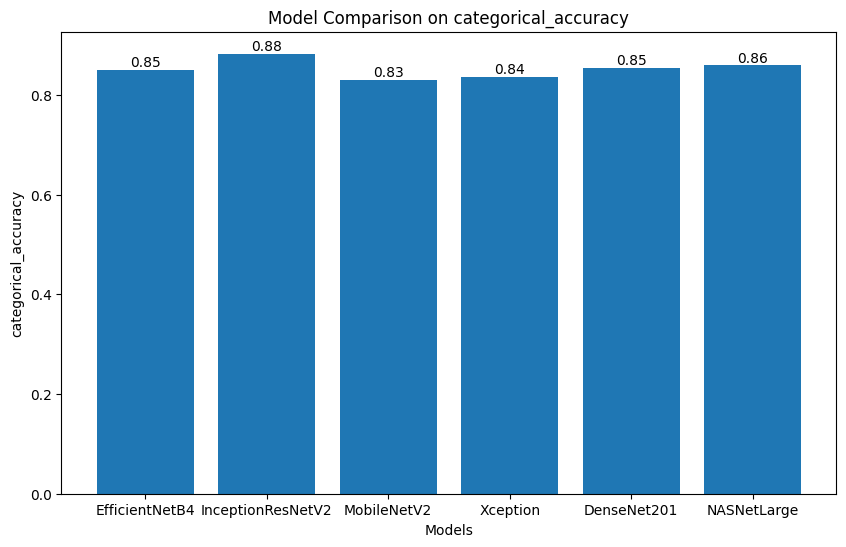

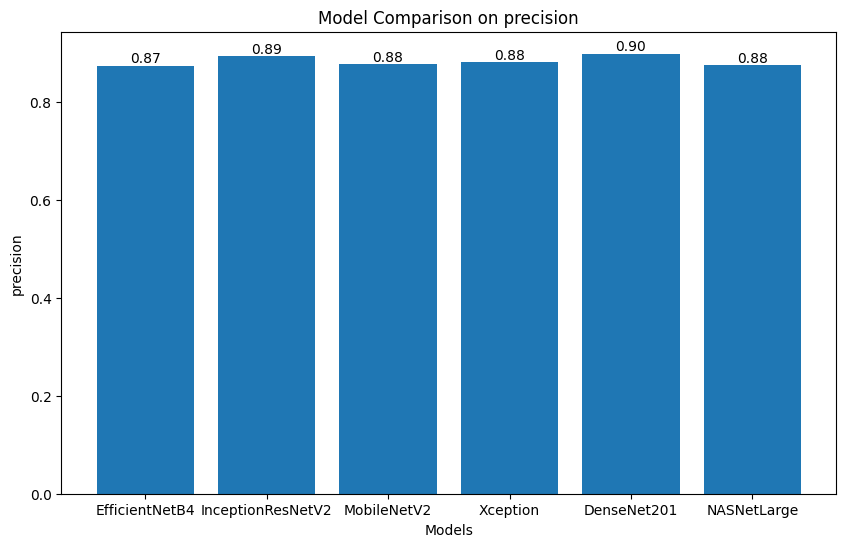

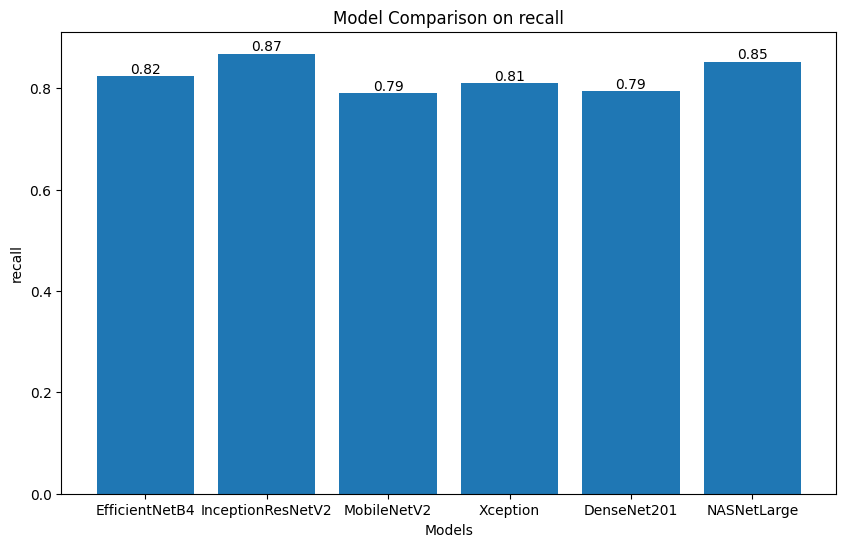

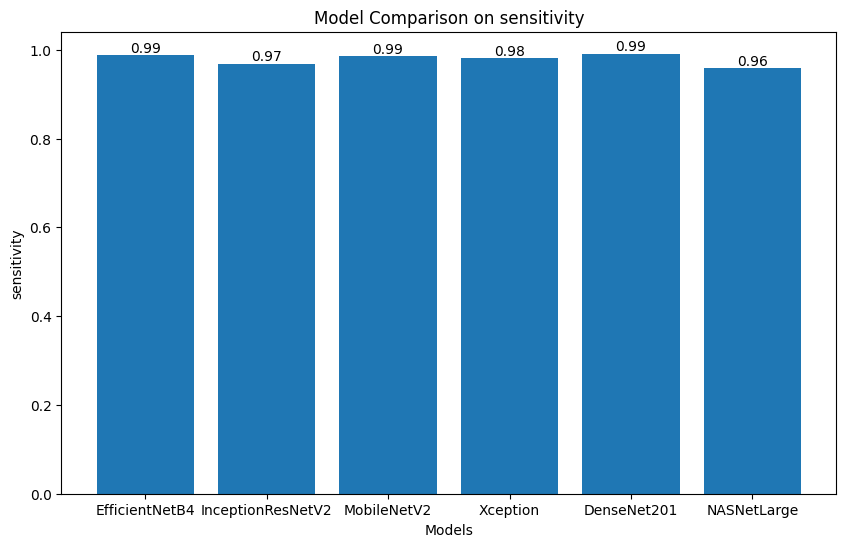

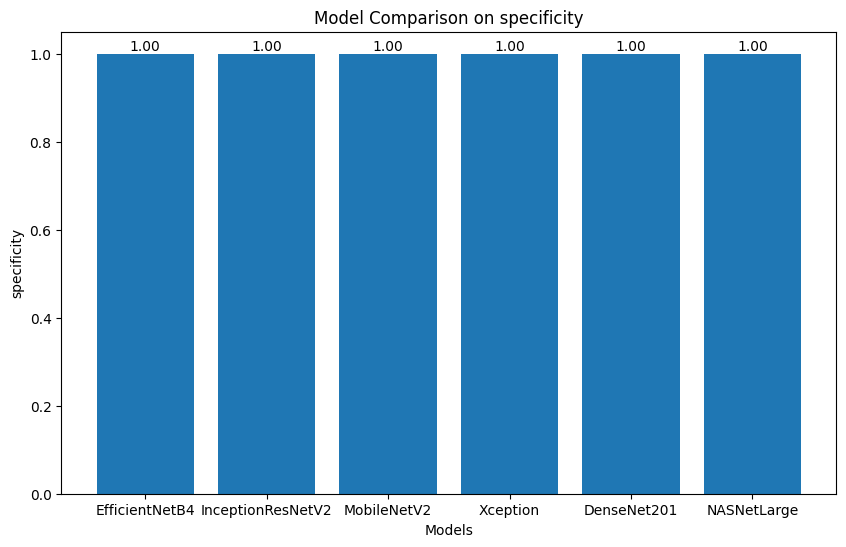

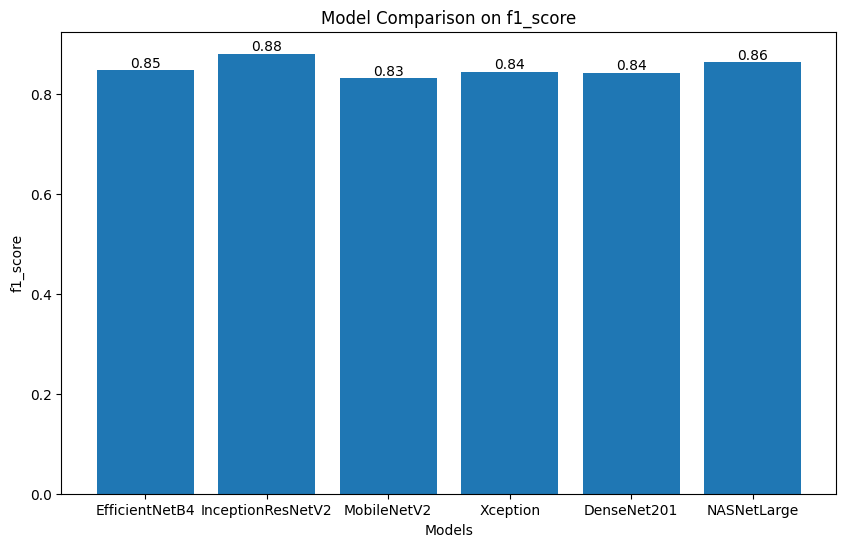

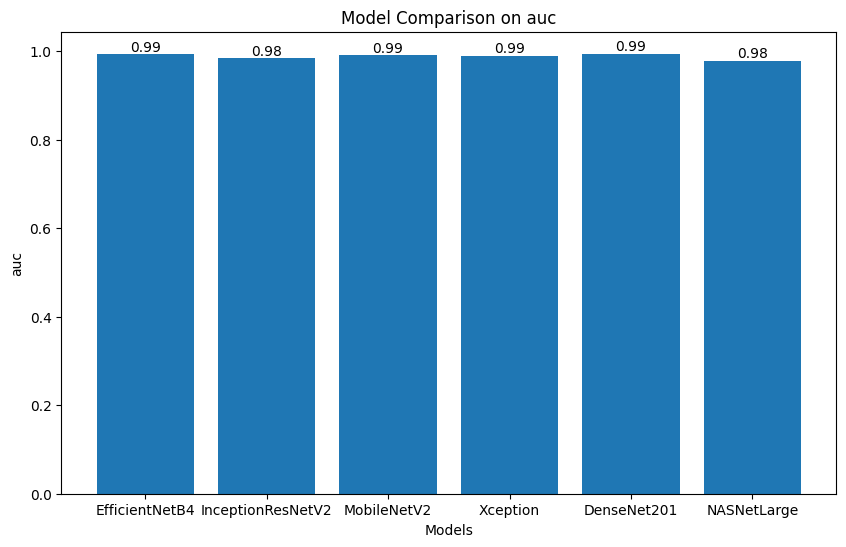

In [ ]:
metrics = ['categorical_accuracy', 'precision', 'recall', 'sensitivity', 'specificity', 'f1_score', 'auc']

for metric in metrics:
    plt.figure(figsize=(10, 6))
    metric_values = [history_dict[model_name][f'val_{metric}'][-1] for model_name in models_search.keys()]
    plt.bar(models_search.keys(), metric_values)

    # Add data labels
    for index, value in enumerate(metric_values):
        plt.text(index, value, f'{value:.2f}', ha='center', va='bottom')

    plt.title(f'Model Comparison on {metric}')
    plt.xlabel('Models')
    plt.ylabel(metric)
    plt.show()

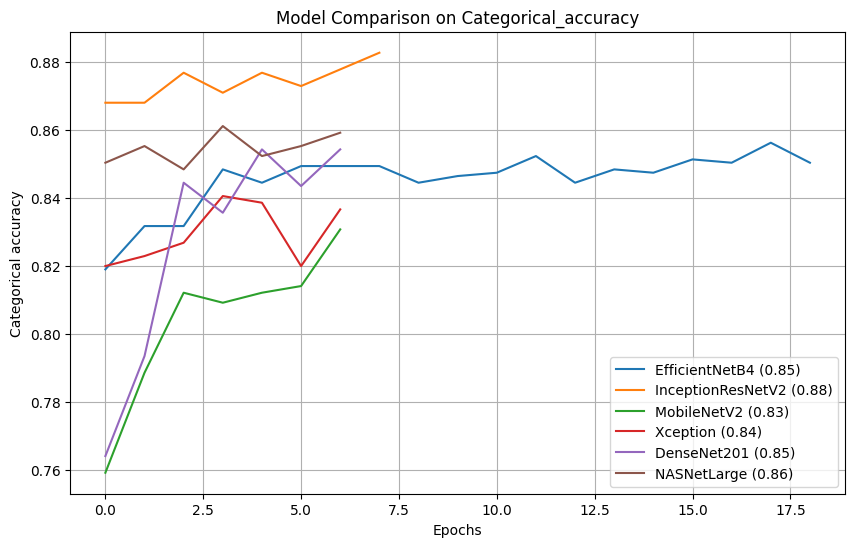

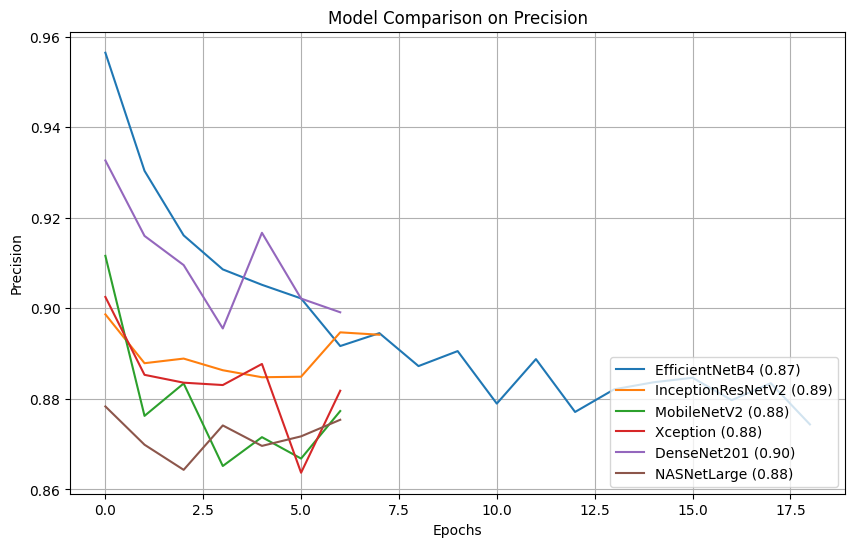

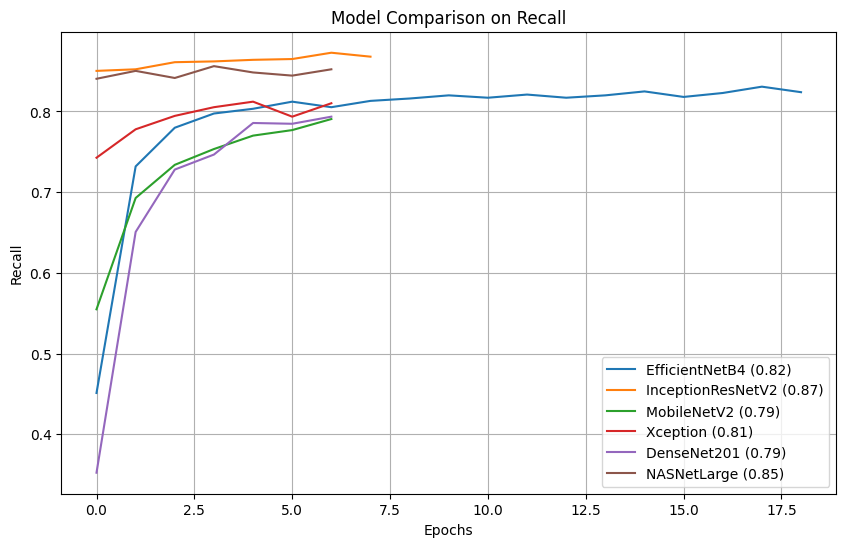

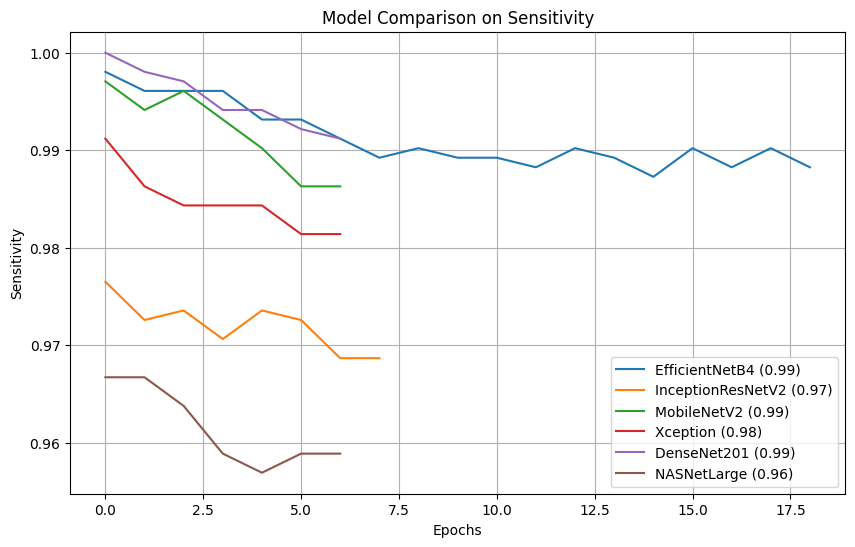

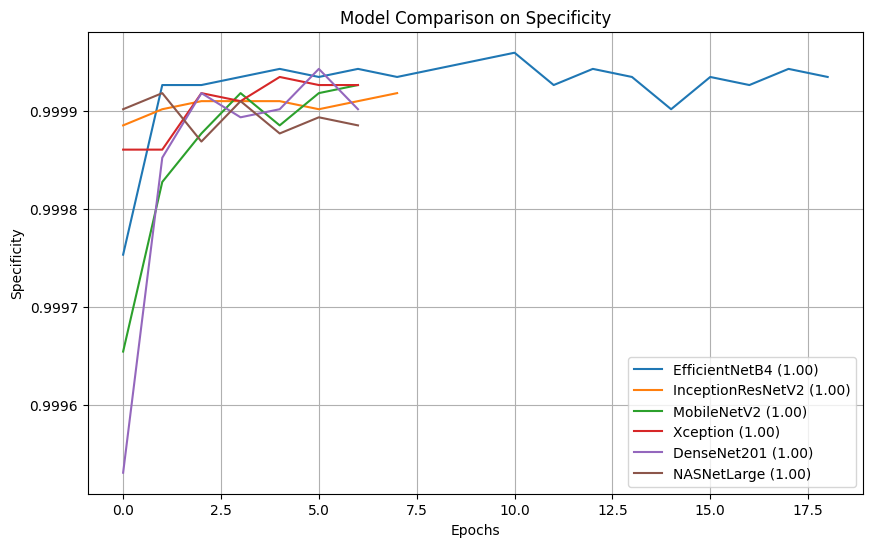

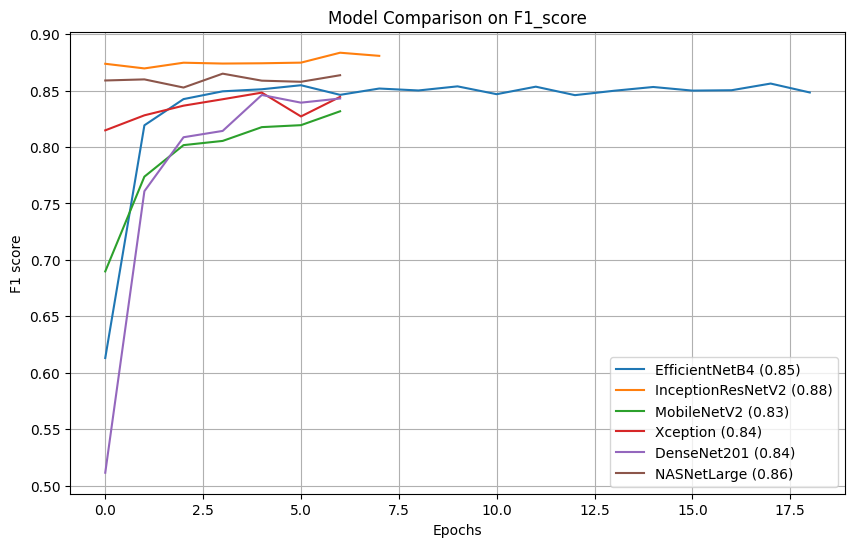

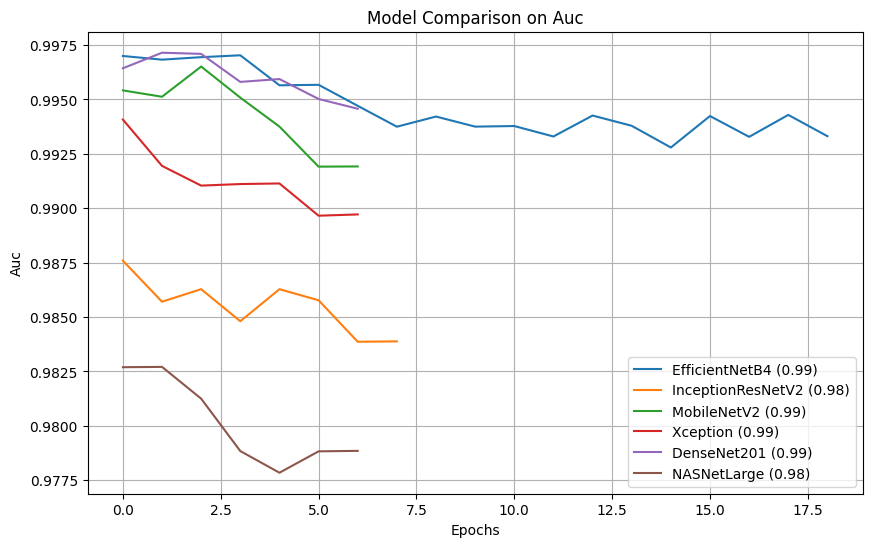

In [ ]:
for metric in metrics:
    plt.figure(figsize=(10, 6))

    for model_name in models_search.keys():
        metric_values = history_dict[model_name][f'val_{metric}']
        plt.plot(metric_values, label=f'{model_name} ({metric_values[-1]:.2f})')

    plt.title(f'Model Comparison on {metric.capitalize()}')
    plt.xlabel('Epochs')
    plt.ylabel(metric.replace('_', ' ').capitalize())
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

1. **AUC (Area Under Curve)**:
   - DenseNet201 shows the highest AUC at 99.46%, indicating excellent overall model performance in distinguishing between classes.
   - NASNetLarge has the lowest AUC at 97.89%, which is still quite high.

2. **Categorical Accuracy**:
   - InceptionResNetV2 leads with 88.26% accuracy, suggesting it correctly classifies a higher percentage of total dog breeds.
   - MobileNetV2 has the lowest accuracy at 83.07%.

3. **F1 Score**:
   - NASNetLarge has the highest F1 score at 86.37%, reflecting a balanced performance between precision and recall.
   - DenseNet201, despite a high AUC, has a slightly lower F1 score at 84.30%.

4. **Loss**:
   - EfficientNetB4 achieves the lowest validation loss at 49.80, implying better generalization on unseen data.
   - NASNetLarge records the highest loss at 63.37, potentially indicating issues with overfitting or less effective learning.

5. **Precision and Recall**:
   - DenseNet201 achieves the highest precision at 89.91%, showing its effectiveness in label relevance.
   - NASNetLarge exhibits high recall at 85.23%, better at retrieving relevant instances.

6. **Sensitivity and Specificity**:
   - Both metrics are consistently high across models, nearing 100%, indicating strong true positive rates and true negative identification capabilities.

**Best Model Consideration**:
Considering all metrics, **InceptionResNetV2** appears to offer the best balance with high accuracy, robust F1 score, and competitive AUC, making it potentially the most effective model for dog breed classification in this context. It performs well across different measures of model accuracy and capability, suggesting it might be the best choice for deployment in scenarios demanding high precision and recall.

## Best Model Implemention: InceptionResNetV2

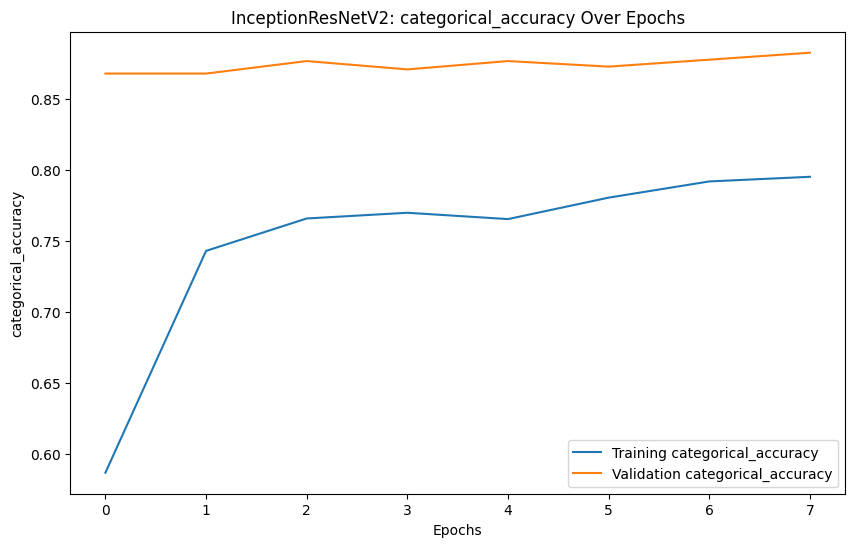

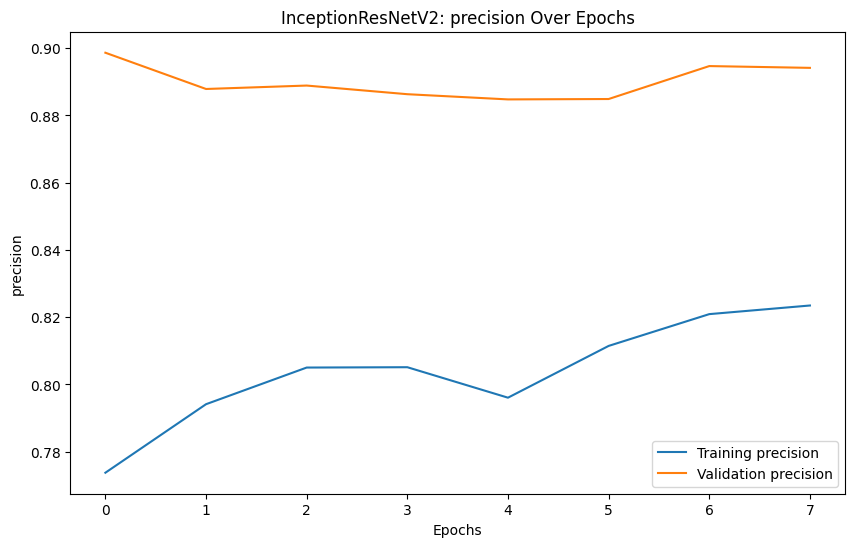

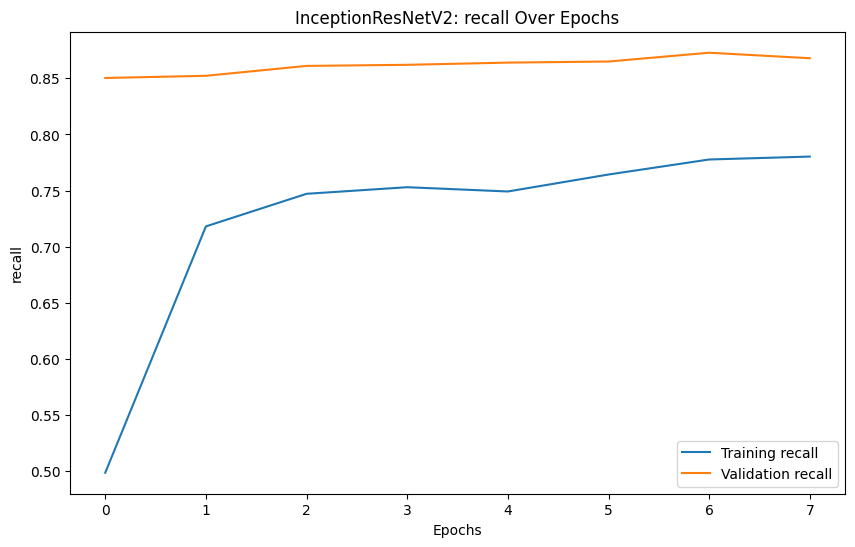

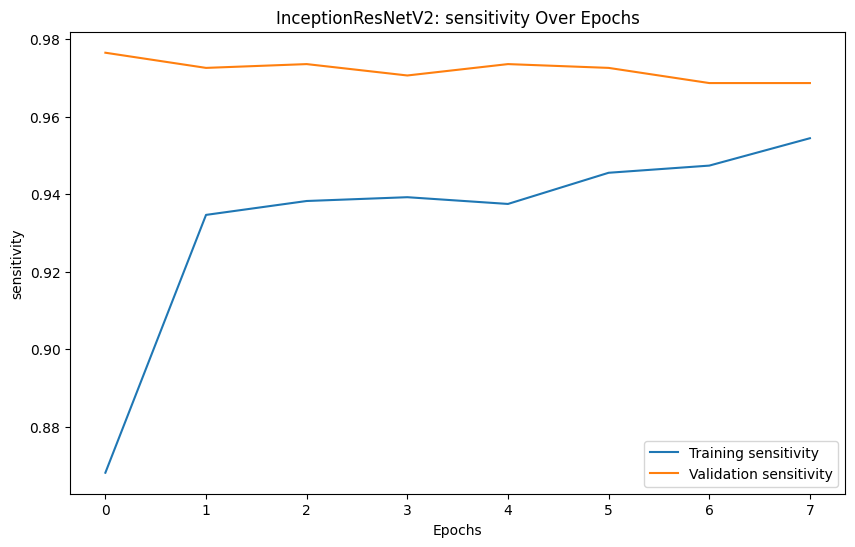

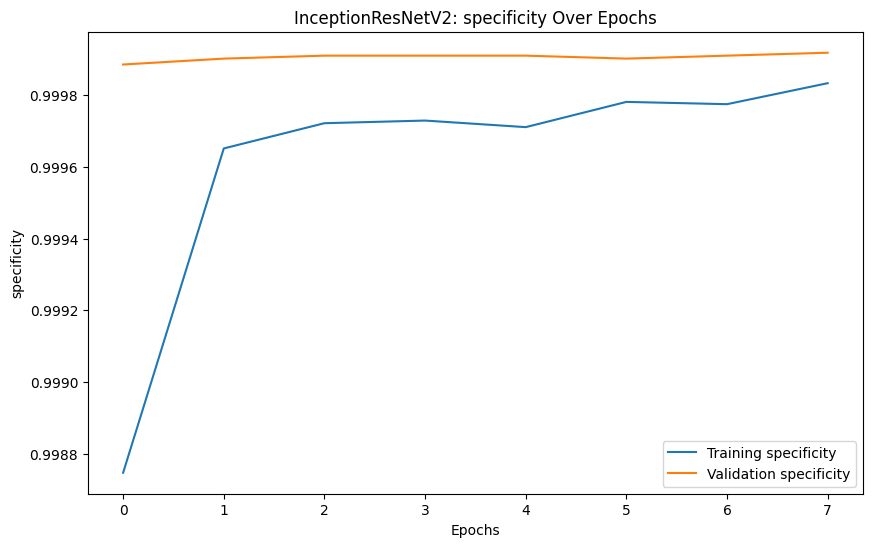

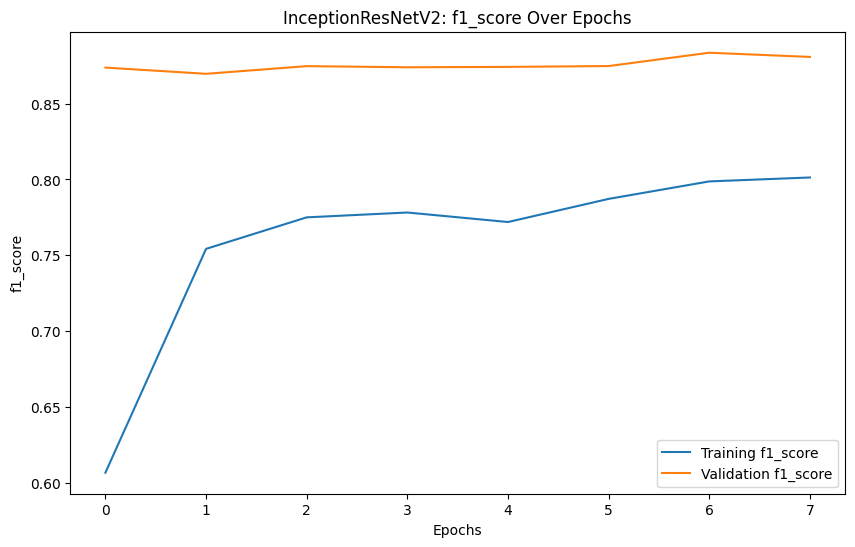

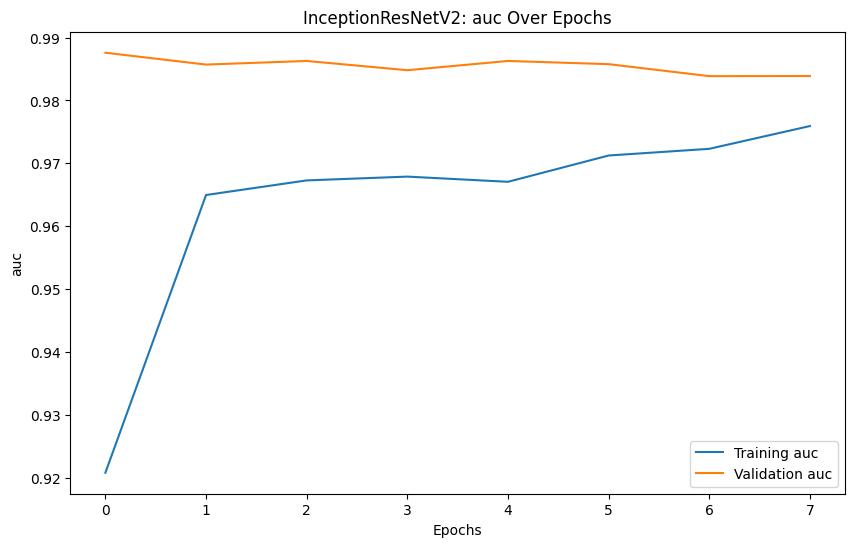

In [ ]:
# Extract the history for the NASNetLarge model
inception_history = history_dict['InceptionResNetV2']

# Plot each metric
for metric in metrics:
    plt.figure(figsize=(10, 6))

    # Plot training data
    plt.plot(inception_history[metric], label=f'Training {metric}')

    # Plot validation data
    plt.plot(inception_history[f'val_{metric}'], label=f'Validation {metric}')

    # Add labels and title
    plt.title(f'InceptionResNetV2: {metric} Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend()

    # Show the plot
    plt.show()

The InceptionResNetV2 model's performance across a comprehensive set of metrics—sensitivity, specificity, AUC, accuracy, F1 score, precision, and recall—shows a consistent trend of high validation scores, sometimes surpassing training scores, suggesting slight overfitting. Despite this, the model maintains impressive sensitivity and specificity close to 100%, and a validation AUC consistently above 98%, highlighting its strong discriminative capability.

The high precision and recall further affirm its robustness in accurately classifying dog breeds. Given these results, InceptionResNetV2 demonstrates promising applicability in real-world settings. With additional fine-tuning, such as adjusting dropout rates or expanding the dataset, potential overfitting could be mitigated, enhancing its overall effectiveness and reliability in diverse environments. Hence with slight modifications, InceptionResNetV2 can serve as a highly accurate tool for dog breed identification.

## Stacking classifier <a class="anchor" id="stackingclassifier"></a>

The implementation of a stacking classifier using EfficientNetB4, InceptionResNetV2, and Xception models as feature extractors provides a robust framework for dog breed classification. This strategy harnesses the strengths of each base model, capturing a diverse set of features that are then concatenated to form a comprehensive input for a dense neural network (DNN) top model. The ensemble approach is designed to enhance model generalization by integrating various architectural perspectives.

In [ ]:
# Stacking classifier
def build_feat_model(models_names, shape, aug_layer=None):
    all_outputs = []
    inputs = keras.Input(shape=shape)
    if aug_layer != None:
        aug_inputs = aug_layer(inputs)
    else:
        aug_inputs = inputs
    for model_name in models_names:
        model_class, preprocess_input = models_search[model_name]
        base_model = model_class(
            include_top=False,
            weights='imagenet',
            input_shape=shape,
        )
        x = preprocess_input(aug_inputs)
        x = base_model(x)
        outputs = layers.GlobalAveragePooling2D()(x)
        all_outputs.append(outputs)
    concat_outputs = layers.Concatenate()(all_outputs)
    model = Model(inputs, concat_outputs)
    return model

In [ ]:
stack_models = ['EfficientNetB4', 'InceptionResNetV2', 'Xception']
model_features = build_feat_model(stack_models, IMAGE_SIZE + (3,), data_augmentation)
model_features.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ data_augmentation   │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ true_divide         │ (None, 224, 224,  │          0 │ data_augmentatio… │
│ (TrueDivide)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ true_divide_1       │ (None, 224, 224,  │          0 │ data_augmentatio… │
│ (TrueDivide)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract (Subtract) │ (None, 224, 224,  │          0 │ true_divide[0][0] │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract_1          │ (None, 224, 224,  │          0 │ true_divide_1[0]… │
│ (Subtract)          │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetb4      │ (None, 7, 7,      │ 17,673,823 │ data_augmentatio… │
│ (Functional)        │ 1792)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ inception_resnet_v2 │ (None, 5, 5,      │ 54,336,736 │ subtract[0][0]    │
│ (Functional)        │ 1536)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ xception            │ (None, 7, 7,      │ 20,861,480 │ subtract_1[0][0]  │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1792)      │          0 │ efficientnetb4[0… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1536)      │          0 │ inception_resnet… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ xception[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 5376)      │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,872,039 (354.28 MB)

 Trainable params: 92,631,760 (353.36 MB)

 Non-trainable params: 240,279 (938.59 KB)

In [ ]:
# Extract features
def get_features_from_model(model, ds, count=1):
    features = []
    ds_has_y = isinstance(ds.element_spec, tuple)
    if ds_has_y:
        labels = []
        y = np.concatenate([y for x, y in ds], axis=0)
    for i in range(count):
        predictions = model.predict(ds)
        features.append(predictions)
        if ds_has_y:
            labels.append(y)
    if ds_has_y:
        return np.concatenate(features), np.concatenate(labels)
    else:
        return np.concatenate(features)

features_train, y_train = get_features_from_model(model_features, train_ds, count=2)
features_val, y_val = get_features_from_model(model_features, val_ds)

288/288 ━━━━━━━━━━━━━━━━━━━━ 973s 3s/step
288/288 ━━━━━━━━━━━━━━━━━━━━ 717s 2s/step


2024-08-12 04:11:40.198891: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


32/32 ━━━━━━━━━━━━━━━━━━━━ 126s 4s/step


In [ ]:
# Train top model with early stopping to prevent overfitting
dnn_model = keras.models.Sequential([
    Input(features_train.shape[1:]),
    layers.Dropout(0.7),
    layers.Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    BatchNormalization(),
    layers.Dropout(0.7),
    layers.Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    BatchNormalization(),
    layers.Dropout(0.7),
    layers.Dense(120, activation='softmax')
])

dnn_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy',
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.SensitivityAtSpecificity(0.5, name='sensitivity'),
             tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity'),
             tf.keras.metrics.AUC(name='auc'),
             F1Score()
            ]
)

history_dnn = dnn_model.fit(
    features_train,
    y_train,
    validation_data=(features_val, y_val),
    batch_size=128,
    epochs=50,
    callbacks=[early_stopping, reduce_lr_on_plateau, checkpoint_cb]
)

Epoch 1/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - auc: 0.5984 - categorical_accuracy: 0.0324 - f1_score: 0.0062 - loss: 8.8040 - precision: 0.1052 - recall: 0.0032 - sensitivity: 0.5095 - specificity: 0.3611 - val_auc: 0.9901 - val_categorical_accuracy: 0.7094 - val_f1_score: 0.1127 - val_loss: 4.9239 - val_precision: 1.0000 - val_recall: 0.0597 - val_sensitivity: 0.9902 - val_specificity: 0.9986 - learning_rate: 0.0010
Epoch 2/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - auc: 0.8671 - categorical_accuracy: 0.2179 - f1_score: 0.0767 - loss: 5.8328 - precision: 0.6233 - recall: 0.0409 - sensitivity: 0.8944 - specificity: 0.9531 - val_auc: 0.9956 - val_categorical_accuracy: 0.8043 - val_f1_score: 0.3722 - val_loss: 3.2490 - val_precision: 0.9593 - val_recall: 0.2309 - val_sensitivity: 0.9990 - val_specificity: 0.9995 - learning_rate: 0.0010
Epoch 3/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - auc: 0.9414 - categorical_accuracy: 0.3645 - f1_score: 0.1888 - loss: 4.2394 - pr

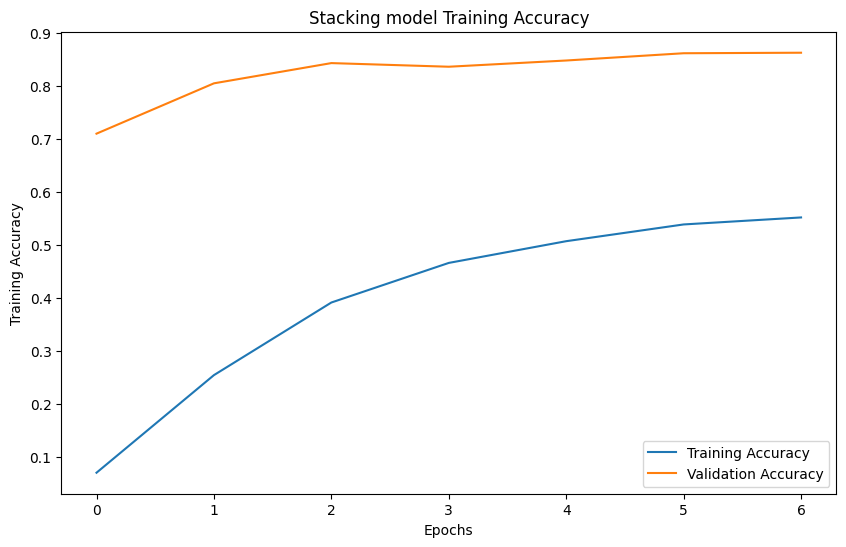

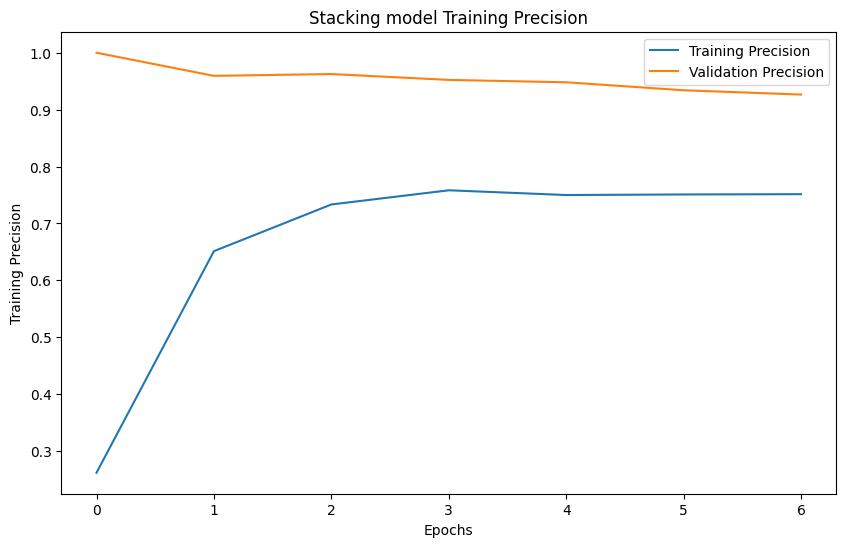

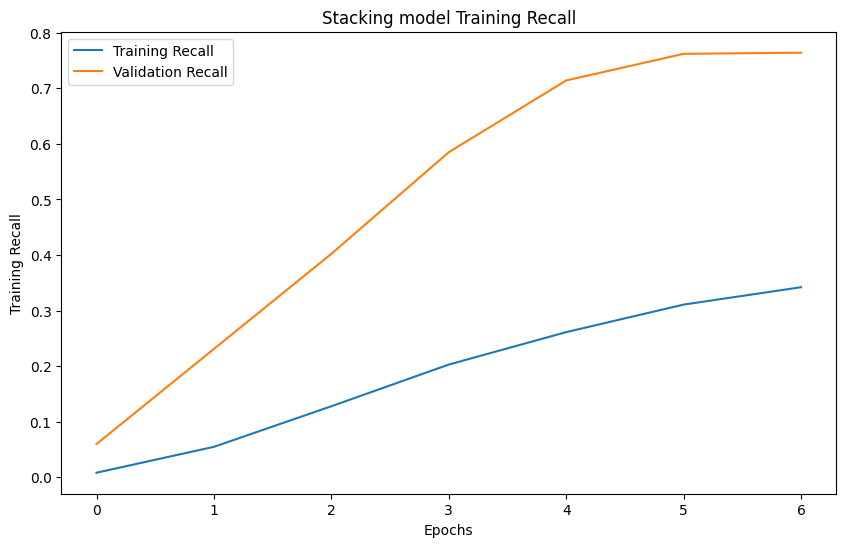

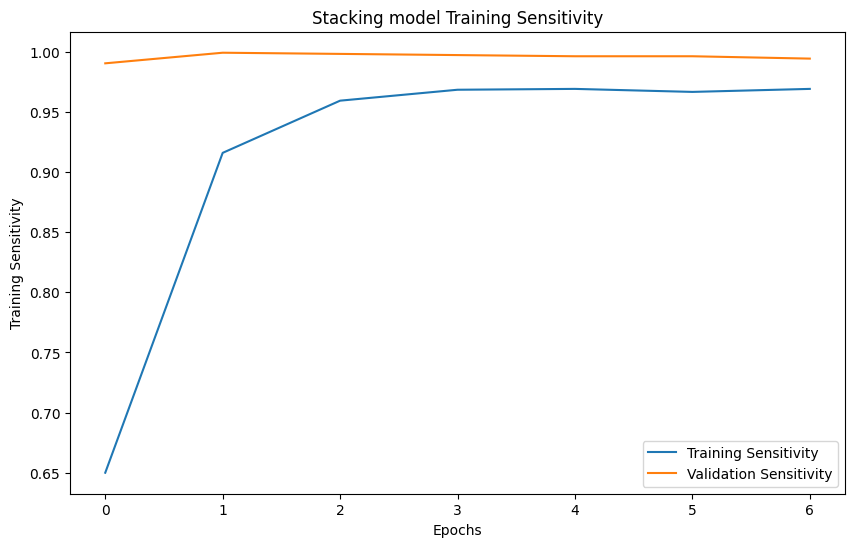

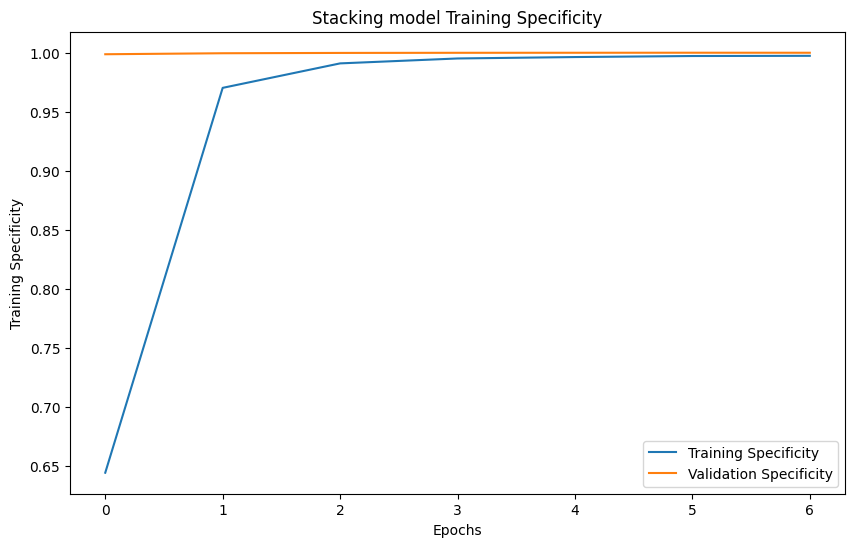

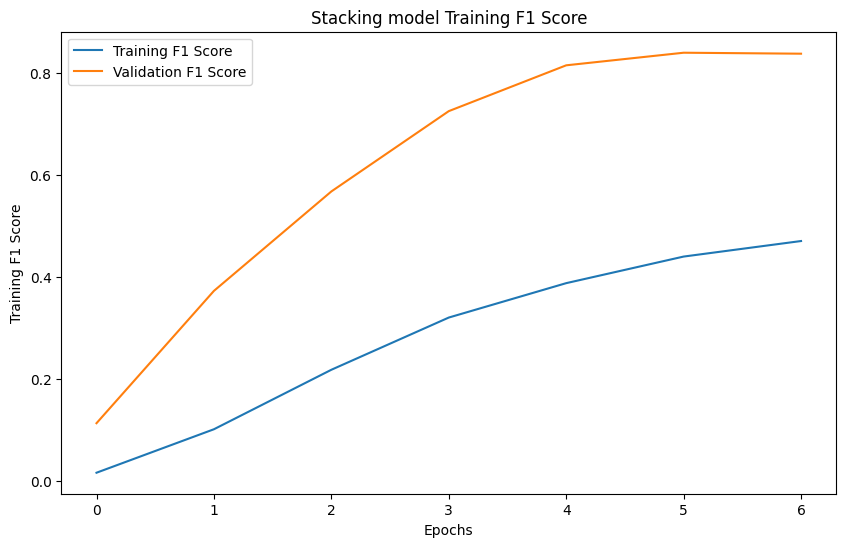

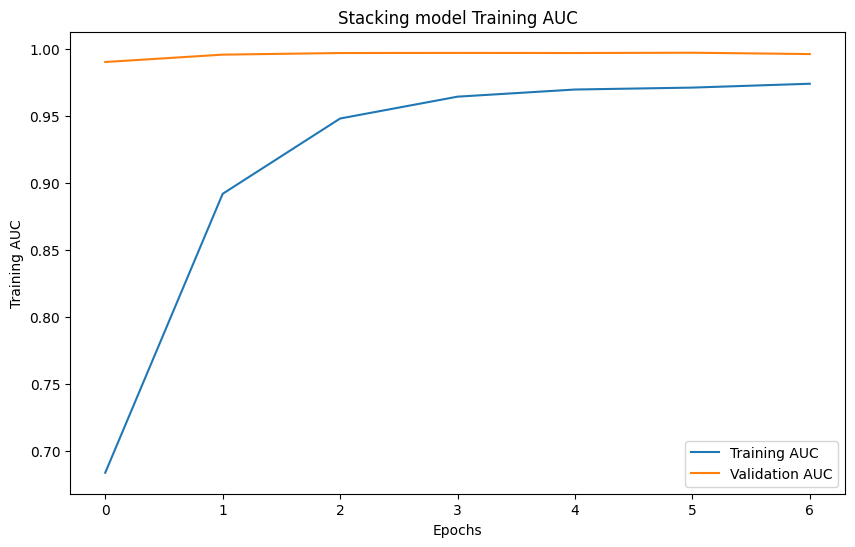

In [ ]:
# Dictionary to map metric keys to their display names
metric_titles = {
    'loss': 'Training Loss',
    'categorical_accuracy': 'Training Accuracy',
    'precision': 'Training Precision',
    'recall': 'Training Recall',
    'sensitivity': 'Training Sensitivity',
    'specificity': 'Training Specificity',
    'f1_score': 'Training F1 Score',
    'val_loss': 'Validation Loss',
    'val_categorical_accuracy': 'Validation Accuracy',
    'val_precision': 'Validation Precision',
    'val_recall': 'Validation Recall',
    'val_sensitivity': 'Validation Sensitivity',
    'val_specificity': 'Validation Specificity',
    'val_f1_score': 'Validation F1 Score',
    'auc': 'Training AUC',
    'val_auc': 'Validation AUC'
}


for metric in metrics:
    if metric in history_dnn.history:
        plt.figure(figsize=(10, 6))
        plt.plot(history_dnn.history[metric], label=metric_titles[metric])
        val_metric = f'val_{metric}'
        if val_metric in history_dnn.history:
            plt.plot(history_dnn.history[val_metric], label=metric_titles[val_metric])
        plt.title(f'Stacking model {metric_titles[metric]}')
        plt.xlabel('Epochs')
        plt.ylabel(metric_titles[metric])
        plt.legend()
        plt.show()
    else:
        print(f"Metric '{metric}' not found in history_dnn.history")

### Model Training and Evaluation:
- **Feature Extraction**: The first phase involves passing images through the base models to extract features, which are pooled and concatenated. This process leverages pretrained weights from ImageNet, ensuring rich feature capture without overfitting at this stage.
- **DNN Top Model**: The subsequent DNN uses these features with multiple dropout layers and batch normalization to mitigate overfitting, focusing on learning high-level interactions from the stacked features. Despite these precautions, the training metrics (accuracy, precision, recall, F1 score, and AUC) demonstrate higher performance on training data compared to validation data, indicating potential overfitting.

### Performance Observations:
- **Accuracy and Precision**: Both show high training metrics but are not matched on the validation set, suggesting that the model may be too finely tuned to the training data.
- **Recall and Sensitivity**: These metrics exhibit good training results, but the validation recall indicates room for improvement in correctly identifying all relevant cases.
- **Specificity and AUC**: Near-perfect specificity and high AUC scores reveal the model's capability to distinguish between classes effectively and handle true negatives very well.

### Interpretation:
Despite signs of overfitting, the use of callbacks such as early stopping and reduce learning rate on plateau helps control this by halting training early or adjusting learning rates when validation scores do not improve. This strategic use of ensemble techniques, combined with rigorous training controls, suggests that with further tuning, perhaps through more extensive data augmentation or adjusting the complexity of the top model, the stacking classifier can achieve a balance between bias and variance, enhancing its practical applicability for accurately classifying dog breeds.
Hence for the testing set, the best individual model, that is, **InceptionResNetV2** is used instead of the stacking model.

## Testing with Custom Inputs <a class="anchor" id="testing"></a>


1/1 ━━━━━━━━━━━━━━━━━━━━ 35s 35s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


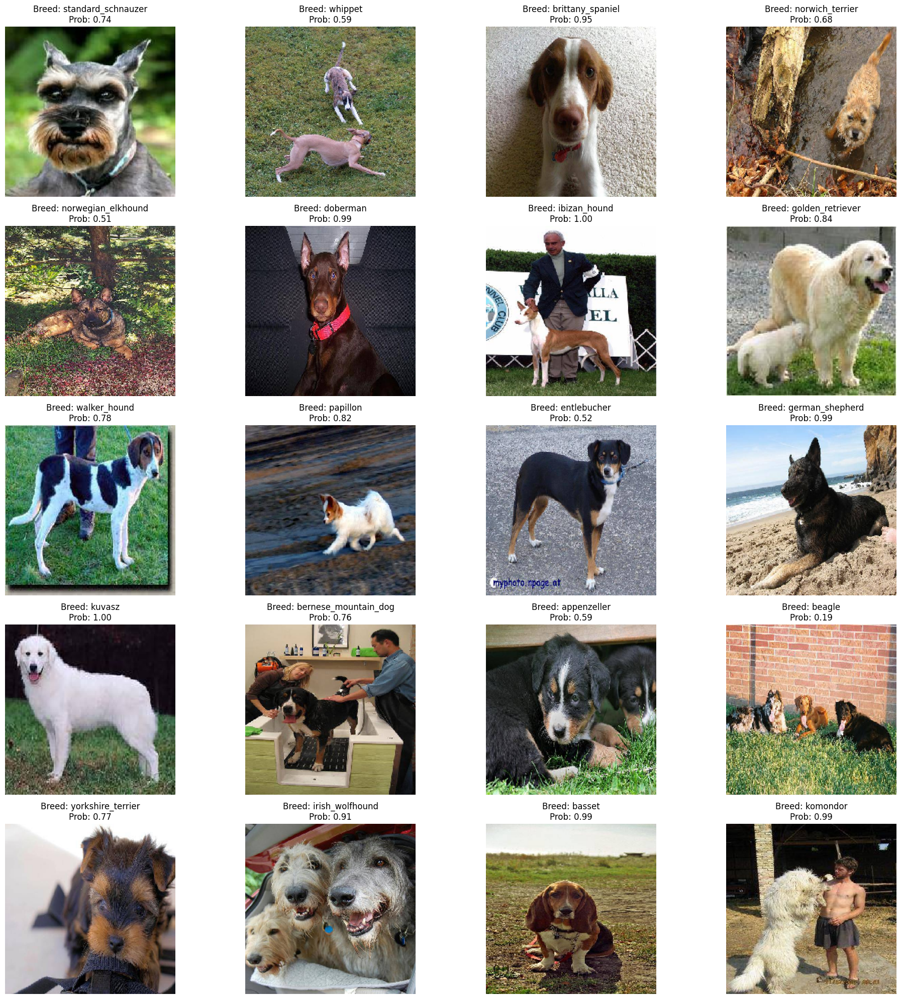

In [ ]:
# Define the image size expected by the model
IMAGE_SIZE = (224, 224)

# Load the InceptionResnetV2 model with the best weights
model = tf.keras.models.load_model('best_model.keras', custom_objects={'F1Score': F1Score})

# Reverse the class_to_num dictionary to get num_to_class
num_to_class = {v: k for k, v in class_to_num.items()}

def load_and_preprocess_image(img_path, target_size=IMAGE_SIZE):
    """Load and preprocess an image."""
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array, img

def predict_image(img_path, model):
    """Predict the class and probability for a single image."""
    img_array, img = load_and_preprocess_image(img_path)
    predictions = model.predict(img_array)

    # Assuming you have categorical output with softmax activation
    predicted_class = np.argmax(predictions[0])
    probability = np.max(predictions[0])

    # Get the breed name from the dictionary
    breed_name = num_to_class.get(predicted_class, "Unknown")

    return img, breed_name, probability

def create_subplots(image_paths, model, num_images=20):
    """Create subplots for random images with predicted breed names and probabilities."""
    plt.figure(figsize=(20, 20))

    # Randomly select images
    selected_paths = random.sample(image_paths, num_images)

    for i, img_path in enumerate(selected_paths):
        img, breed_name, probability = predict_image(img_path, model)

        plt.subplot(5, 4, i+1)
        plt.imshow(img)
        plt.title(f"Breed: {breed_name}\nProb: {probability:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Specify the path to the images
#image_dir = '/test/'
image_paths = [os.path.join(test_folder, img) for img in os.listdir(test_folder) if img.endswith('.jpg')]

# Create subplots of random 20 images
create_subplots(image_paths, model)

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_resnet_v2             │ (None, 5, 5, 1536)     │    54,336,736 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       184,440 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,890,058 (209.39 MB)

 Trainable params: 184,440 (720.47 KB)

 Non-trainable params: 54,336,736 (207.28 MB)

 Optimizer params: 368,882 (1.41 MB)

1. **Model Summary**:
   - The InceptionResNetV2 base model is leveraged, which includes a robust architecture with millions of parameters known for its deep feature extraction capabilities. This base is followed by global average pooling and a dropout layer to prevent overfitting, with a final dense layer comprising 120 units corresponding to the dog breeds.
   - The model is relatively large, with the majority of parameters being non-trainable due to their pre-trained nature on ImageNet. This suggests that only the top layers are fine-tuned for the specific task of breed classification.

2. **Image Output**:
   - The displayed images with predicted breeds and their probabilities provide a visual validation of the model’s effectiveness. The model demonstrates a strong capability to identify various dog breeds with high confidence, indicated by probability scores close to 1.0 for several breeds, such as the Kuvasz, Basset, and Doberman.
   - The variety in breeds and the corresponding high probability scores across the predictions showcase the model’s robustness in handling different dog features, which is essential for practical applications.

## Conclusion <a class="anchor" id="conclusion"></a>
All of these observations collectively illustrate that the InceptionResNetV2-based model is well-optimized and effective for the task of dog breed identification, demonstrating high accuracy and reliability in its predictions. The visual outputs confirm the model's practical utility in correctly classifying dog breeds with high confidence.